In [1]:
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

# Урок 1. Кейс 1. EDA по Hourly Energy Consumption и Brent.

**1. Выберите наборы данных. которые можно интерпретировать, как временные ряды:**

    а) зависимость цены на недвижимость в конкретном регионе от времени,

    б) скорость полета самолета при перелете из аэропорта А в аэропорт В,

    в) количество отказов компьютера,

    г) число обращений в поликлинику по району,

    д) координаты автобуса при движении по маршруту,

    е) координаты фигуры нарушителя в файле видеофиксации охранной системы.

В пункте $а)$ есть указание на зависимость измеряемой величины от времени, поэтому это точно временной ряд. Остальные наборы данных, если так же имеют временную метку (а об этом не сказано), то их так же все можно интерпретировать как временные ряды.

**2. Прочитайте DUQ_hourly.csv и проверьте качество и порядок разметки этой выборки с информацией о потреблении энергии в одном из районов Восточной Электросети США. Сделайте описание особенностей этой выборки.**

In [2]:
DUQ_hourly = pd.read_csv('./datasets/DUQ_hourly.csv', index_col=[0], parse_dates=[0])

DUQ_hourly.head()

,DUQ_MW
Datetime,
2005-12-31 01:00:00,1458.0
2005-12-31 02:00:00,1377.0
2005-12-31 03:00:00,1351.0
2005-12-31 04:00:00,1336.0
2005-12-31 05:00:00,1356.0


In [3]:
DUQ_hourly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 119068 entries, 2005-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   DUQ_MW  119068 non-null  float64
dtypes: float64(1)
memory usage: 1.8 MB


In [4]:
# проверка на пропуски
DUQ_hourly['DUQ_MW'].isnull().sum()

0

Имеются данные с `2005-12-31 01:00:00` по `2018-01-02 00:00:00`, интервал измерений 1 час. Всего 119068 записей, пропусков нет. Тип целевой переменной `float64`.

In [5]:
# основные статистики ряда
DUQ_hourly.describe()

,DUQ_MW
count,119068.000000
mean,1658.820296
std,301.740640
min,1014.000000
25%,1444.000000
50%,1630.000000
75%,1819.000000
max,3054.000000


Измеряемые данные лежат в диапазоне от 1014 до 3054 МВт. Тип данных `float64` избыточен. Приведём данные к типу `int`.

In [6]:
DUQ_hourly['DUQ_MW'] = DUQ_hourly['DUQ_MW'].astype('int')
DUQ_hourly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 119068 entries, 2005-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   DUQ_MW  119068 non-null  int64
dtypes: int64(1)
memory usage: 1.8 MB


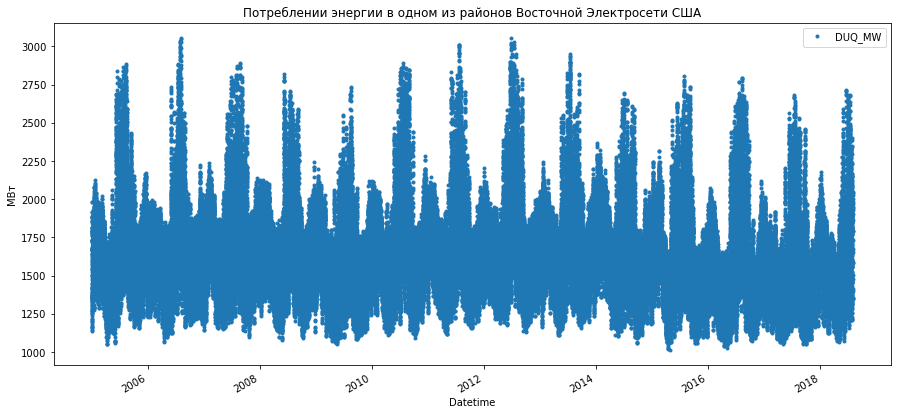

In [12]:
DUQ_hourly.plot(style='.', figsize=(15,7))
plt.ylabel('МВт')
plt.title('Потреблении энергии в одном из районов Восточной Электросети США')
plt.show()

Из графика временного ряда видно что данные имеют циклы. Проверим наличие пропусков и дублей во временных мемтках, вызванных переходом на зимнее время.

In [78]:
DUQ_hourly['date'] = DUQ_hourly.index
DUQ_hourly.head()

,DUQ_MW,date
Datetime,,
2005-12-31 01:00:00,1458.0,2005-12-31 01:00:00
2005-12-31 02:00:00,1377.0,2005-12-31 02:00:00
2005-12-31 03:00:00,1351.0,2005-12-31 03:00:00
2005-12-31 04:00:00,1336.0,2005-12-31 04:00:00
2005-12-31 05:00:00,1356.0,2005-12-31 05:00:00


In [79]:
ut = DUQ_hourly['date'].unique()
print('число уникальных значений:   ',ut.shape[0],' : число наблюдений : ', DUQ_hourly.shape[0])

число уникальных значений:    119064  : число наблюдений :  119068


In [81]:
count_data = DUQ_hourly['date'].value_counts()
count_data.head(10)

2017-11-05 02:00:00    2
2014-11-02 02:00:00    2
2015-11-01 02:00:00    2
2016-11-06 02:00:00    2
2007-07-15 10:00:00    1
2012-02-07 10:00:00    1
2016-09-01 10:00:00    1
2006-05-15 11:00:00    1
2010-12-08 11:00:00    1
2015-07-03 11:00:00    1
Name: date, dtype: int64

С 2014 по 2017 года в начале ноября вносились данные дважды.

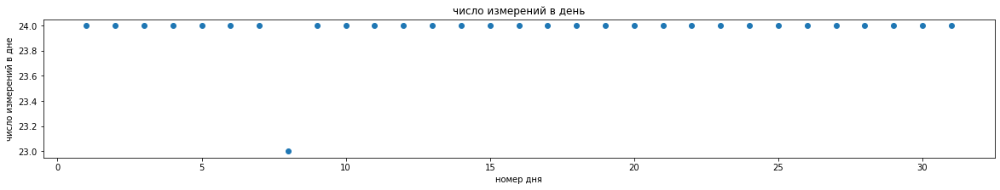

In [16]:
day_H = DUQ_hourly['2015-03-01 00:00:00':'2015-03-31 23:00:00'].index.day

plt.figure(figsize=(20,3))
plt.plot(day_H.value_counts(), 'o')

plt.xlabel('номер дня')
plt.ylabel('число измерений в дне')
plt.title('число измерений в день')
plt.show()

In [18]:
DUQ_hourly['2015-03-08 01:00:00':'2015-03-08 06:00:00'].index

DatetimeIndex(['2015-03-08 01:00:00', '2015-03-08 02:00:00',
               '2015-03-08 04:00:00', '2015-03-08 05:00:00',
               '2015-03-08 06:00:00'],
              dtype='datetime64[ns]', name='Datetime', freq=None)

In [ ]:
В один из дней марта на одно наблюдение меньше, чем в остальные дни. После вторго часа сразу наступил четвёртый. 

In [36]:
DUQ_dayly_count = DUQ_hourly.resample('D').count().rename(axis=1, )
DUQ_dayly_count[DUQ_dayly_count['DUQ_MW'] != 24]

,DUQ_MW
Datetime,
2005-01-01,23
2005-04-03,23
2005-10-30,23
2006-04-02,23
2006-10-29,23
2007-03-11,23
2007-11-04,23
2008-03-09,23
2008-11-02,23


**3. Прочитайте базу Brent и сделайте ее перерасчет (ресемплинг) в представление по неделям , по месяцам.**

In [27]:
brent_data = pd.read_excel('./datasets/brent_2010_2019.xlsx', index_col=[0], parse_dates=[0])
brent_data.head()

,Значение
Дата,
2019-09-01,58.84
2019-08-30,59.19
2019-08-29,60.37
2019-08-28,59.84
2019-08-27,59.59


In [28]:
# отсортируем данные
brent_data = brent_data.sort_index()

In [29]:
brent_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2667 entries, 2010-09-01 to 2019-09-01
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Значение  2667 non-null   float64
dtypes: float64(1)
memory usage: 41.7 KB


В датасете записи с `2010-09-01` по `2019-09-01`. Нет пропусков.

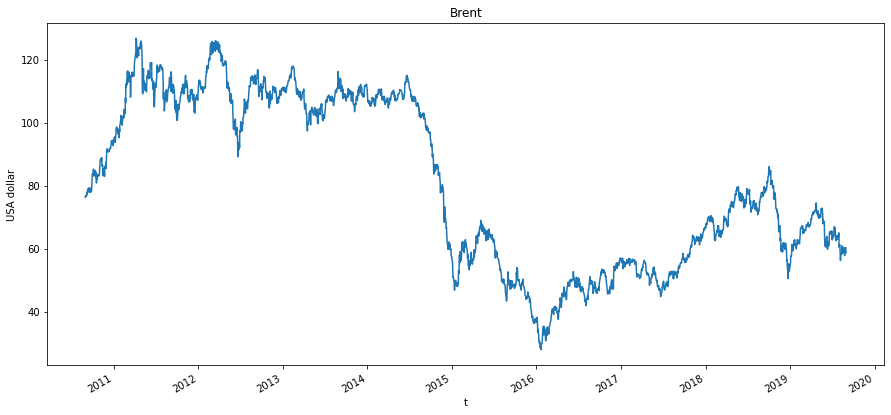

In [35]:
# представление данных по дням
brent_data['Значение'].plot(style='-', figsize=(15, 7), title='Brent')
plt.ylabel('USA dollar')
plt.xlabel('t')
plt.show()

In [45]:
# ресэмплинг данных по неделям
brent_data_week = brent_data.asfreq(freq='1W', method ='pad')
brent_data_week.head()

,Значение
Дата,
2010-09-05,76.63
2010-09-12,78.36
2010-09-19,78.23
2010-09-26,78.94
2010-10-03,83.69


In [46]:
# ресэмплинг данных по месяцам
brent_data_month = brent_data.asfreq(freq='1M', method ='pad')
brent_data_month.head()

,Значение
Дата,
2010-09-30,82.11
2010-10-31,83.26
2010-11-30,85.45
2010-12-31,94.59
2011-01-31,100.56


**4. Постройте график изменения среднего по выборке и среднего отклонения по выборке на недельных, месячных и годовых группах для Brent.**

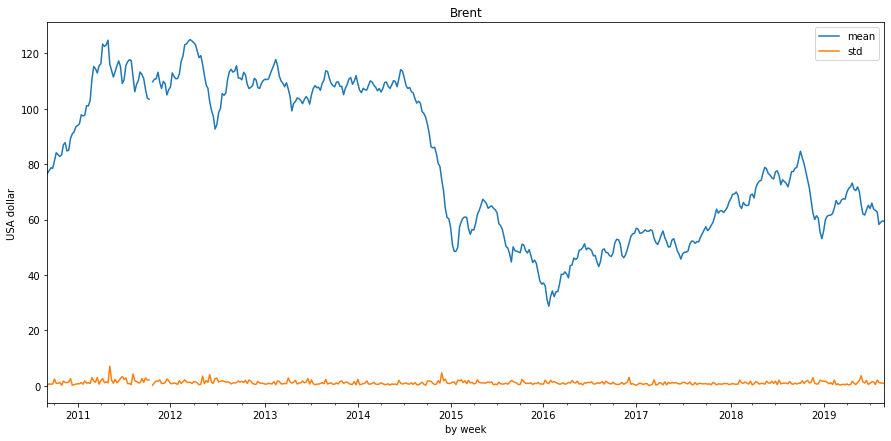

In [56]:
# представление данных по неделям
plt.figure(figsize=(15,7))
brent_data.resample('W').mean()['Значение'].plot(style='-', title="Brent")
brent_data.resample('W').std(ddof=1)['Значение'].plot(style='-', title="Brent")
plt.ylabel('USA dollar')
plt.xlabel('by week')
plt.legend(['mean', 'std'])
plt.show()

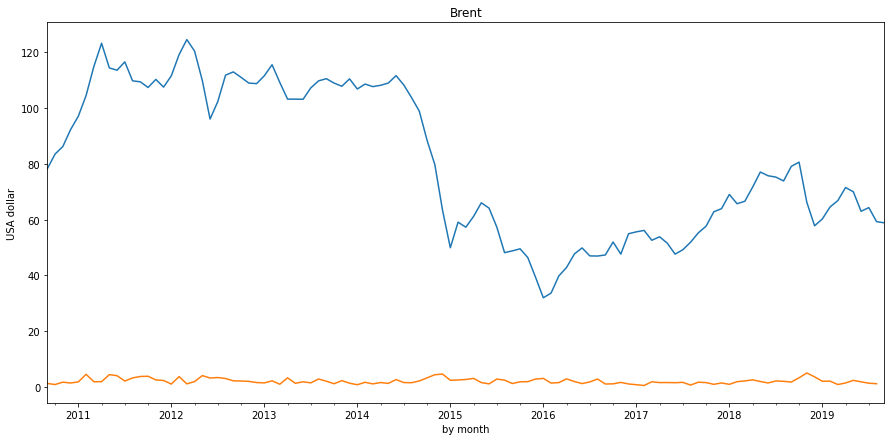

In [57]:
# представление данных по месяцам
plt.figure(figsize=(15,7))
brent_data.resample('M').mean()['Значение'].plot(style='-', title='Brent')
brent_data.resample('M').std(ddof=1)['Значение'].plot(style='-', title='Brent')
plt.ylabel('USA dollar')
plt.xlabel('by month')
plt.show()

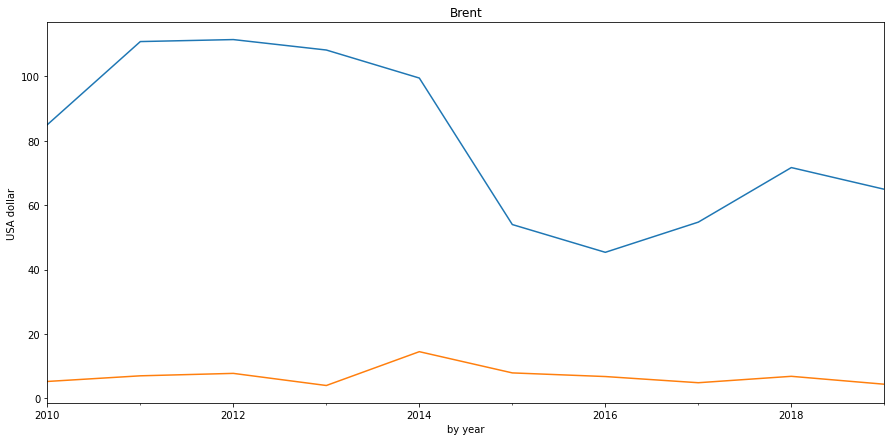

In [58]:
# представление данных по годам
plt.figure(figsize=(15,7))
brent_data.resample('Y').mean()['Значение'].plot(style='-', title='Brent')
brent_data.resample('Y').std(ddof=1)['Значение'].plot(style='-', title='Brent')
plt.ylabel('USA dollar')
plt.xlabel('by year')
plt.show()

Из недельного графика видно что в данных есть разрыв. За период с 2010-09-01 по 2019-09-01 есть 2667 записи, а должно быть 3288. 

In [64]:
pd.date_range(start='2010-09-01', end='2019-09-01', freq='1D').size

3288

**5. Сделайте вывод о том, как изменилось поведение цены на недельных и месячных графиках по сравнению с годовым.**

Чем меньше детализация, тем более однородные данные при ресэмпленге, и тем меньше информации из данных можно получить. 